In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!cp -r /content/drive/MyDrive/chest_xray /content/


In [ ]:
!ls "/content/chest_xray"


chest_xray  __MACOSX  test  train  val


In [1]:
base_dir = '/content/chest_xray'




In [ ]:
train_dir = os.path.join(base_dir, 'train')
val_dir = os.path.join(base_dir, 'val')
test_dir = os.path.join(base_dir, 'test')

print("Train Classes:", os.listdir(train_dir))
print("Validation Classes:", os.listdir(val_dir))
print("Test Classes:", os.listdir(test_dir))



Train Classes: ['PNEUMONIA', 'NORMAL']
Validation Classes: ['PNEUMONIA', 'NORMAL']
Test Classes: ['NORMAL', 'PNEUMONIA']


In [ ]:
import os

def count_images(folder):
    normal = len(os.listdir(os.path.join(folder, 'NORMAL')))
    pneumonia = len(os.listdir(os.path.join(folder, 'PNEUMONIA')))
    return normal, pneumonia

train_normal, train_pneumonia = count_images(train_dir)
val_normal, val_pneumonia = count_images(val_dir)
test_normal, test_pneumonia = count_images(test_dir)

print(f"Train - NORMAL: {train_normal}, PNEUMONIA: {train_pneumonia}")
print(f"Validation - NORMAL: {val_normal}, PNEUMONIA: {val_pneumonia}")
print(f"Test - NORMAL: {test_normal}, PNEUMONIA: {test_pneumonia}")


Train - NORMAL: 1341, PNEUMONIA: 3875
Validation - NORMAL: 8, PNEUMONIA: 8
Test - NORMAL: 234, PNEUMONIA: 390


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

target_size = (224, 224)
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=target_size,
    batch_size=32,
    class_mode='binary',
    subset='training'
)

validation_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=target_size,
    batch_size=32,
    class_mode='binary',
    subset='validation'
)


Found 4173 images belonging to 2 classes.
Found 1043 images belonging to 2 classes.


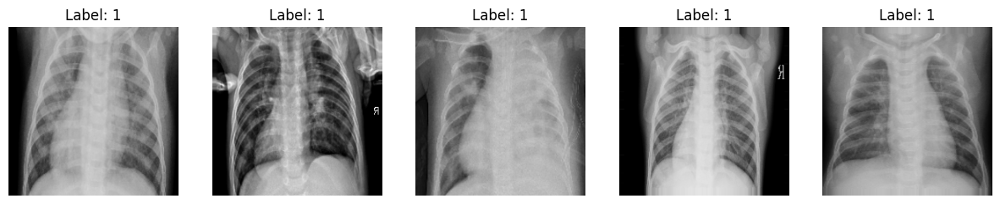

In [ ]:
import matplotlib.pyplot as plt

images, labels = next(train_generator)

plt.figure(figsize=(15, 5))
for i in range(5):
    plt.subplot(1, 5, i+1)
    plt.imshow(images[i])
    plt.title(f"Label: {int(labels[i])}")
    plt.axis('off')
plt.show()


In [ ]:
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=target_size,
    batch_size=32,
    class_mode='binary',
    shuffle=False
)


Found 624 images belonging to 2 classes.


In [ ]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.optimizers import Adam

base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(1, activation='sigmoid')(x)

model = Model(inputs=base_model.input, outputs=output)

model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True)

history = model.fit(
    train_generator,
    epochs=30,
    validation_data=validation_generator,
    callbacks=[early_stop, checkpoint]
)


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 749ms/step - accuracy: 0.7919 - loss: 0.4315

131/131 ━━━━━━━━━━━━━━━━━━━━ 139s 981ms/step - accuracy: 0.7923 - loss: 0.4308 - val_accuracy: 0.9367 - val_loss: 0.2001
Epoch 2/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 672ms/step - accuracy: 0.9173 - loss: 0.2092

131/131 ━━━━━━━━━━━━━━━━━━━━ 110s 838ms/step - accuracy: 0.9173 - loss: 0.2092 - val_accuracy: 0.9367 - val_loss: 0.1766
Epoch 3/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 688ms/step - accuracy: 0.9266 - loss: 0.1869

131/131 ━━━━━━━━━━━━━━━━━━━━ 113s 860ms/step - accuracy: 0.9266 - loss: 0.1868 - val_accuracy: 0.9473 - val_loss: 0.1512
Epoch 4/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 111s 851ms/step - accuracy: 0.9402 - loss: 0.1496 - val_accuracy: 0.9377 - val_loss: 0.1562
Epoch 5/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 672ms/step - accuracy: 0.9431 - loss: 0.1449

131/131 ━━━━━━━━━━━━━━━━━━━━ 129s 990ms/step - accuracy: 0.9431 - loss: 0.1449 - val_accuracy: 0.9540 - val_loss: 0.1403
Epoch 6/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 678ms/step - accuracy: 0.9500 - loss: 0.1367

131/131 ━━━━━━━━━━━━━━━━━━━━ 110s 843ms/step - accuracy: 0.9500 - loss: 0.1367 - val_accuracy: 0.9473 - val_loss: 0.1372
Epoch 7/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 675ms/step - accuracy: 0.9472 - loss: 0.1240

131/131 ━━━━━━━━━━━━━━━━━━━━ 111s 849ms/step - accuracy: 0.9472 - loss: 0.1240 - val_accuracy: 0.9492 - val_loss: 0.1368
Epoch 8/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 676ms/step - accuracy: 0.9477 - loss: 0.1384

131/131 ━━━━━━━━━━━━━━━━━━━━ 111s 851ms/step - accuracy: 0.9477 - loss: 0.1383 - val_accuracy: 0.9597 - val_loss: 0.1213
Epoch 9/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 109s 833ms/step - accuracy: 0.9608 - loss: 0.1075 - val_accuracy: 0.9463 - val_loss: 0.1379
Epoch 10/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 679ms/step - accuracy: 0.9528 - loss: 0.1202

131/131 ━━━━━━━━━━━━━━━━━━━━ 111s 852ms/step - accuracy: 0.9529 - loss: 0.1201 - val_accuracy: 0.9501 - val_loss: 0.1193
Epoch 11/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 664ms/step - accuracy: 0.9540 - loss: 0.1218

131/131 ━━━━━━━━━━━━━━━━━━━━ 110s 838ms/step - accuracy: 0.9540 - loss: 0.1218 - val_accuracy: 0.9559 - val_loss: 0.1146
Epoch 12/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 109s 833ms/step - accuracy: 0.9548 - loss: 0.1169 - val_accuracy: 0.9521 - val_loss: 0.1174
Epoch 13/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 110s 841ms/step - accuracy: 0.9553 - loss: 0.1079 - val_accuracy: 0.9473 - val_loss: 0.1242
Epoch 14/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 110s 840ms/step - accuracy: 0.9588 - loss: 0.1056 - val_accuracy: 0.9549 - val_loss: 0.1182
Epoch 15/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 689ms/step - accuracy: 0.9572 - loss: 0.1056

131/131 ━━━━━━━━━━━━━━━━━━━━ 113s 864ms/step - accuracy: 0.9572 - loss: 0.1056 - val_accuracy: 0.9578 - val_loss: 0.1107
Epoch 16/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 698ms/step - accuracy: 0.9642 - loss: 0.1035

131/131 ━━━━━━━━━━━━━━━━━━━━ 115s 877ms/step - accuracy: 0.9642 - loss: 0.1035 - val_accuracy: 0.9607 - val_loss: 0.1033
Epoch 17/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 112s 854ms/step - accuracy: 0.9604 - loss: 0.0958 - val_accuracy: 0.9626 - val_loss: 0.1119
Epoch 18/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 132s 1s/step - accuracy: 0.9632 - loss: 0.0920 - val_accuracy: 0.9540 - val_loss: 0.1083
Epoch 19/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 112s 857ms/step - accuracy: 0.9646 - loss: 0.0930 - val_accuracy: 0.9492 - val_loss: 0.1175
Epoch 20/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 703ms/step - accuracy: 0.9690 - loss: 0.0872

131/131 ━━━━━━━━━━━━━━━━━━━━ 147s 898ms/step - accuracy: 0.9690 - loss: 0.0873 - val_accuracy: 0.9597 - val_loss: 0.0927
Epoch 21/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 120s 915ms/step - accuracy: 0.9674 - loss: 0.0830 - val_accuracy: 0.9597 - val_loss: 0.0940
Epoch 22/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 720ms/step - accuracy: 0.9694 - loss: 0.0887

131/131 ━━━━━━━━━━━━━━━━━━━━ 116s 888ms/step - accuracy: 0.9694 - loss: 0.0888 - val_accuracy: 0.9655 - val_loss: 0.0917
Epoch 23/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 113s 860ms/step - accuracy: 0.9616 - loss: 0.0964 - val_accuracy: 0.9674 - val_loss: 0.0979
Epoch 24/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 113s 861ms/step - accuracy: 0.9642 - loss: 0.0922 - val_accuracy: 0.9636 - val_loss: 0.1014
Epoch 25/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 140s 850ms/step - accuracy: 0.9724 - loss: 0.0837 - val_accuracy: 0.9636 - val_loss: 0.0949
Epoch 26/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 131s 1s/step - accuracy: 0.9692 - loss: 0.0850 - val_accuracy: 0.9664 - val_loss: 0.0960
Epoch 27/30
131/131 ━━━━━━━━━━━━━━━━━━━━ 130s 994ms/step - accuracy: 0.9663 - loss: 0.0864 - val_accuracy: 0.9501 - val_loss: 0.1155


In [ ]:
# After training — Save in Drive permanently
model.save('/content/drive/MyDrive/best_model.h5')


In [ ]:
model.save('/content/drive/MyDrive/best_model.keras')


In [ ]:
test_loss, test_accuracy = model.evaluate(test_generator, verbose=1)
print(f"Test Accuracy: {test_accuracy*100:.2f}%")
print(f"Test Loss: {test_loss:.4f}")


20/20 ━━━━━━━━━━━━━━━━━━━━ 260s 14s/step - accuracy: 0.8385 - loss: 0.3664
✅ Test Accuracy: 89.26%
✅ Test Loss: 0.2521


In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report

test_generator.reset()
predictions = model.predict(test_generator, verbose=1)
predicted_classes = (predictions > 0.5).astype(int).reshape(-1)

true_classes = test_generator.classes

cm = confusion_matrix(true_classes, predicted_classes)
print("Confusion Matrix:\n", cm)

report = classification_report(true_classes, predicted_classes, target_names=['NORMAL', 'PNEUMONIA'])
print("Classification Report:\n", report)


20/20 ━━━━━━━━━━━━━━━━━━━━ 13s 459ms/step
✅ Confusion Matrix:
 [[178  56]
 [ 11 379]]
✅ Classification Report:
               precision    recall  f1-score   support

      NORMAL       0.94      0.76      0.84       234
   PNEUMONIA       0.87      0.97      0.92       390

    accuracy                           0.89       624
   macro avg       0.91      0.87      0.88       624
weighted avg       0.90      0.89      0.89       624



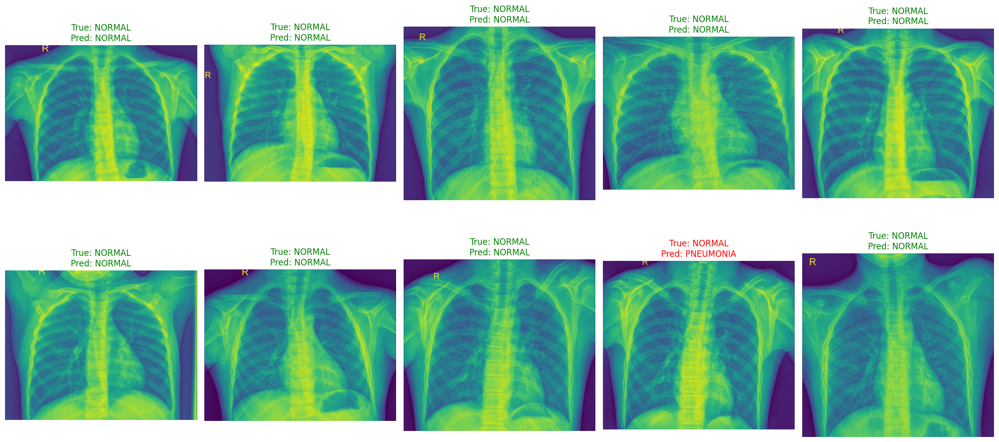

In [ ]:
import numpy as np

test_generator.reset()
file_paths = test_generator.filepaths

plt.figure(figsize=(20, 10))
for i in range(10):
    img = plt.imread(file_paths[i])
    plt.subplot(2, 5, i + 1)
    plt.imshow(img)
    true_label = 'NORMAL' if true_classes[i] == 0 else 'PNEUMONIA'
    pred_label = 'NORMAL' if predicted_classes[i] == 0 else 'PNEUMONIA'
    color = 'green' if true_label == pred_label else 'red'
    plt.title(f"True: {true_label}\nPred: {pred_label}", color=color)
    plt.axis('off')
plt.tight_layout()
plt.show()


🔹 Showing batch 8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


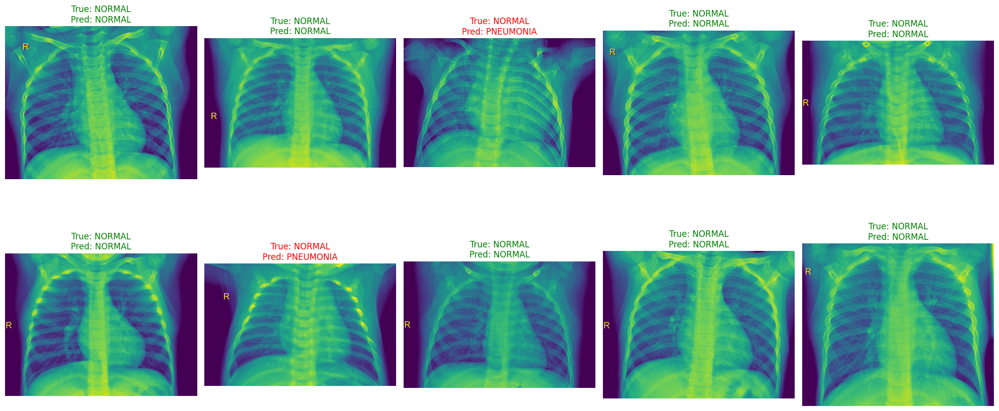

🔹 Showing batch 9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


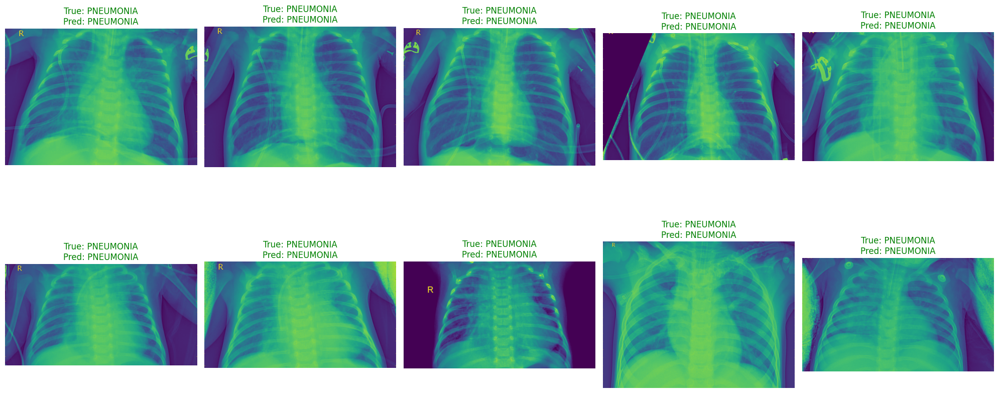

🔹 Showing batch 10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


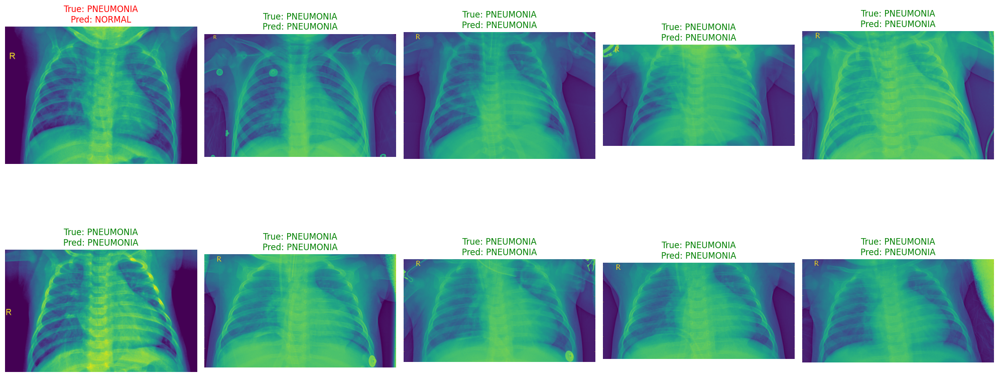

🔹 Showing batch 11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


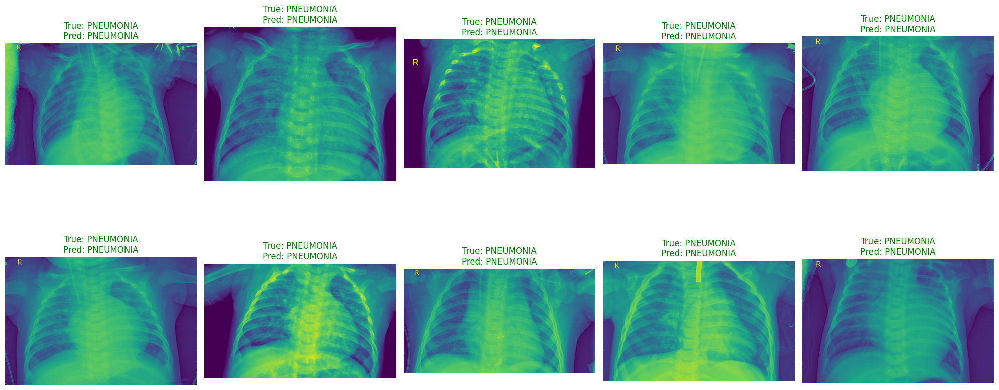

In [ ]:
test_generator.reset()

file_paths = test_generator.filepaths
batch_size = test_generator.batch_size

start_batch = 8
end_batch = 11

for _ in range(start_batch - 1):
    next(test_generator)

for batch_num in range(start_batch, end_batch + 1):
    print(f"🔹 Showing batch {batch_num}")

    images, labels = next(test_generator)
    predictions = model.predict(images)
    predicted_classes = (predictions > 0.5).astype(int).reshape(-1)

    start_idx = (batch_num - 1) * batch_size
    end_idx = start_idx + len(images)

    plt.figure(figsize=(20, 10))
    for i in range(min(10, len(images))):
        img_path = file_paths[start_idx + i]
        img = plt.imread(img_path)

        plt.subplot(2, 5, i + 1)
        plt.imshow(img)

        true_label = 'NORMAL' if labels[i] == 0 else 'PNEUMONIA'
        pred_label = 'NORMAL' if predicted_classes[i] == 0 else 'PNEUMONIA'
        color = 'green' if true_label == pred_label else 'red'

        plt.title(f"True: {true_label}\nPred: {pred_label}", color=color)
        plt.axis('off')

    plt.tight_layout()
    plt.show()


In [ ]:
import tensorflow as tf
import numpy as np

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    grad_model = tf.keras.models.Model(
        [model.inputs],
        [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()


In [ ]:
import tensorflow as tf
import numpy as np

def get_img_array(img_path, size=(224, 224)):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=size)
    array = tf.keras.preprocessing.image.img_to_array(img)
    array = np.expand_dims(array, axis=0)
    return array / 255.0


In [ ]:
import cv2
import matplotlib.pyplot as plt

def display_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap_uint = np.uint8(255 * heatmap_resized)
    heatmap_color = cv2.applyColorMap(heatmap_uint, cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(img, 1-alpha, heatmap_color, alpha, 0)

    plt.figure(figsize=(8,8))
    plt.imshow(overlay)
    plt.axis('off')
    plt.show()


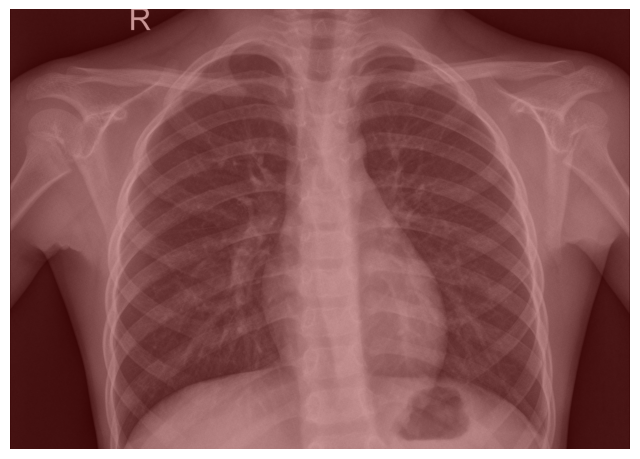

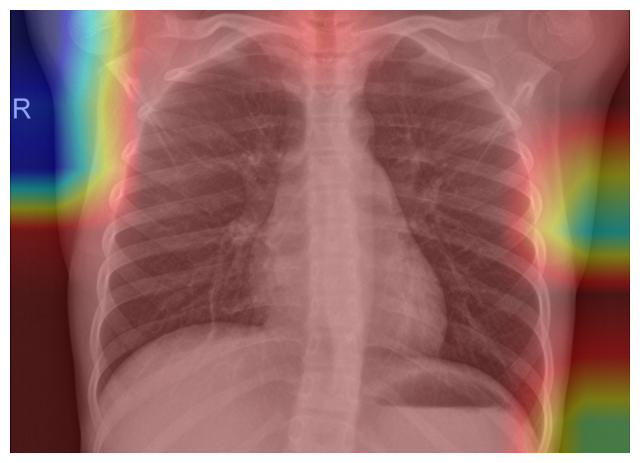

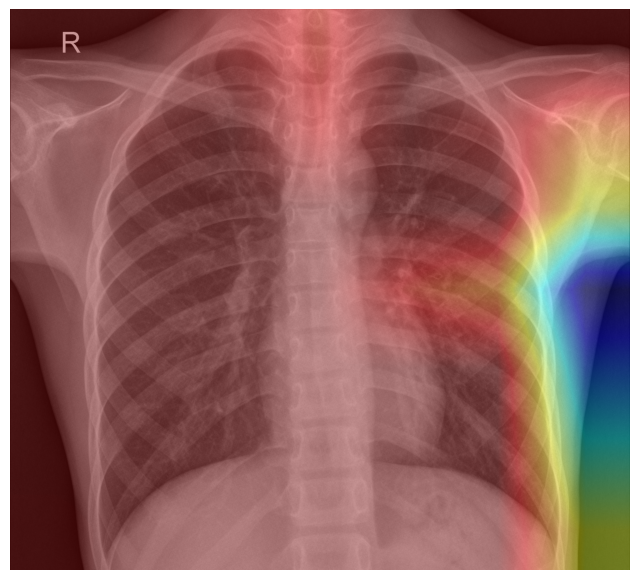

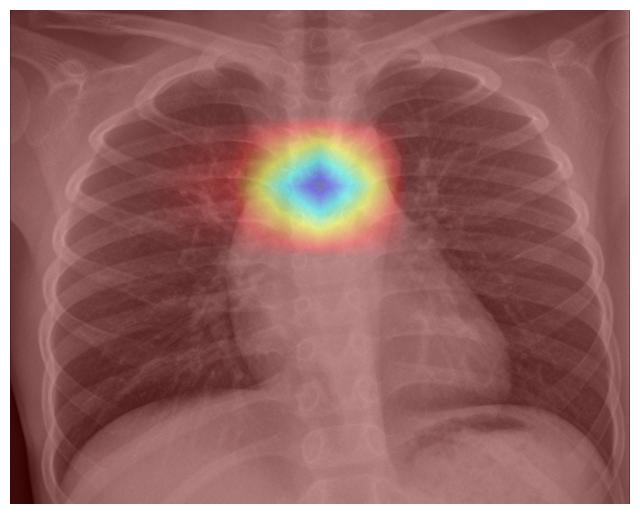

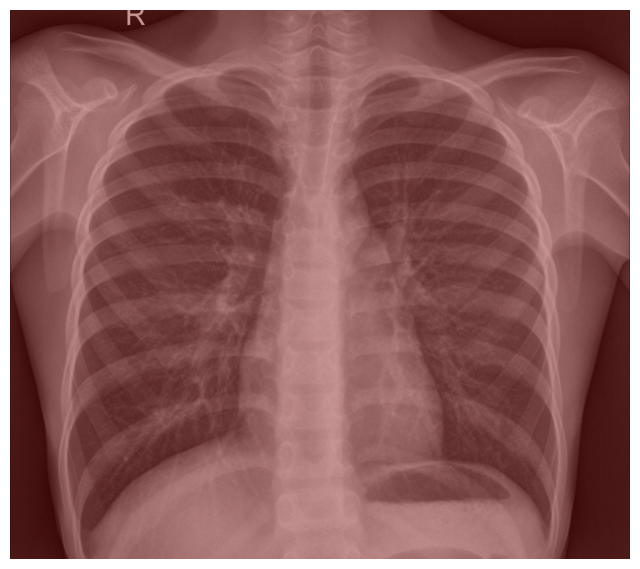

In [ ]:
num_images = 5

for i in range(num_images):
    img_path = file_paths[i]

    img_array = get_img_array(img_path, size=(224, 224))

    heatmap = make_gradcam_heatmap(img_array, model, 'Conv_1')

    display_gradcam(img_path, heatmap)
